In [1]:
#necessary imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
import datetime

In [2]:
# read data 
data = pd.read_csv("Electric_Vehicle_Population_Data.csv")
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJXCAE26J,Yakima,Yakima,WA,98908.0,2018,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,14.0,141151601,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10
1,JHMZC5F37M,Kitsap,Poulsbo,WA,98370.0,2021,HONDA,CLARITY,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,47,0,23.0,171566447,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303509e+10
2,5YJ3E1EB0K,King,Seattle,WA,98199.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,36.0,9426525,POINT (-122.40092 47.65908),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
3,1N4AZ0CP5D,King,Seattle,WA,98119.0,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,36.0,211807760,POINT (-122.3684 47.64586),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
4,5YJSA1E21H,Thurston,Lacey,WA,98516.0,2017,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,210,0,22.0,185810306,POINT (-122.75379 47.06316),PUGET SOUND ENERGY INC,5.306701e+10


# Get all the cars and their types that do not qualify for clean alternative fuel vehicle

In [3]:
data.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [12]:
not_eligible = data[data['Clean Alternative Fuel Vehicle (CAFV) Eligibility']==data['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts().index[-1]]
not_eligible

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
6,3FA6P0PU1G,Thurston,Tumwater,WA,98501.0,2016,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,19,0,22.0,347508836,POINT (-122.89166 47.03956),PUGET SOUND ENERGY INC,5.306701e+10
7,WA1F2AFY8P,Thurston,Lacey,WA,98516.0,2023,AUDI,Q5 E,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,23,0,22.0,227213871,POINT (-122.75379 47.06316),PUGET SOUND ENERGY INC,5.306701e+10
8,1FADP5CU0E,Thurston,Rochester,WA,98579.0,2014,FORD,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,19,0,20.0,229811151,POINT (-123.08743 46.82175),PUGET SOUND ENERGY INC,5.306701e+10
14,1FADP5FU4H,Thurston,Lacey,WA,98513.0,2017,FORD,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,20,0,22.0,139887513,POINT (-122.81754499999994 46.98876000000007),PUGET SOUND ENERGY INC,5.306701e+10
15,KNDCM3LD8L,Kitsap,Bainbridge Island,WA,98110.0,2020,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,23.0,157737730,POINT (-122.521 47.62728),PUGET SOUND ENERGY INC,5.303509e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130377,WBAJA9C55K,King,Seattle,WA,98178.0,2019,BMW,530E,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16,53400,37.0,475884531,POINT (-122.23825 47.49461),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
130385,WAUUPBFF2G,Pierce,Tacoma,WA,98409.0,2016,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,16,0,29.0,179801891,POINT (-122.47554 47.21835),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305306e+10
130390,1C4JJXR65P,Clark,Vancouver,WA,98682.0,2023,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21,0,17.0,226102999,POINT (-122.55149 45.69345),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF C...,5.301104e+10
130407,JTDKARFP1H,Spokane,Spokane,WA,99218.0,2017,TOYOTA,PRIUS PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,25,0,6.0,349989468,POINT (-117.4077 47.74527),BONNEVILLE POWER ADMINISTRATION||AVISTA CORP||...,5.306301e+10


# car and it's type that do not qualify for clean alternative fuel vehicle

In [14]:
not_eligible_car_type = not_eligible[['Model','Electric Vehicle Type']]
not_eligible_car_type

,Model,Electric Vehicle Type
6,FUSION,Plug-in Hybrid Electric Vehicle (PHEV)
7,Q5 E,Plug-in Hybrid Electric Vehicle (PHEV)
8,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV)
14,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV)
15,NIRO,Plug-in Hybrid Electric Vehicle (PHEV)
...,...,...
130377,530E,Plug-in Hybrid Electric Vehicle (PHEV)
130385,A3,Plug-in Hybrid Electric Vehicle (PHEV)
130390,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV)
130407,PRIUS PRIME,Plug-in Hybrid Electric Vehicle (PHEV)


# Get all TESLA cars with the model year, and model type made in Bothell City.


In [41]:
tesla_data = data[data['Make'] =='TESLA']
tesla_made_in_bothell = tesla_data[tesla_data['City'] == "Bothell"][['Model Year','Model']]
tesla_made_in_bothell

,Model Year,Model
39,2020,MODEL 3
217,2022,MODEL 3
218,2022,MODEL Y
222,2018,MODEL 3
292,2017,MODEL X
...,...,...
129778,2019,MODEL 3
129954,2021,MODEL 3
129976,2014,MODEL S
130295,2022,MODEL 3


# Get all the cars that have an electric range of more than 100, and were made after 2015

In [54]:
range_more_than_100 = data[data['Electric Range'] > 100]
range_more_than_100_made_after_2015 = range_more_than_100[range_more_than_100['Model Year'] > 2015]
range_more_than_100_made_after_2015

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJXCAE26J,Yakima,Yakima,WA,98908.0,2018,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,14.0,141151601,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10
2,5YJ3E1EB0K,King,Seattle,WA,98199.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,36.0,9426525,POINT (-122.40092 47.65908),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
4,5YJSA1E21H,Thurston,Lacey,WA,98516.0,2017,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,210,0,22.0,185810306,POINT (-122.75379 47.06316),PUGET SOUND ENERGY INC,5.306701e+10
12,5YJ3E1EC7L,Thurston,Lacey,WA,98503.0,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,22.0,2135486,POINT (-122.82324 47.04437),PUGET SOUND ENERGY INC,5.306701e+10
13,5YJ3E1EB2L,Thurston,Olympia,WA,98516.0,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,22.0,124645363,POINT (-122.75379 47.06316),PUGET SOUND ENERGY INC,5.306701e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130417,5YJYGDEE5L,Pierce,Tacoma,WA,98444.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291,0,29.0,112591538,POINT (-122.46495 47.16778),BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305306e+10
130428,1N4AZ1CP0J,Clallam,Sequim,WA,98382.0,2018,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,151,0,24.0,290405174,POINT (-123.09968999999995 48.08137000000005),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF C...,5.300900e+10
130432,5YJYGDEEXL,King,Vashon,WA,98070.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291,0,34.0,112734723,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
130436,5YJ3E1EB0J,Whatcom,Blaine,WA,98230.0,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,42.0,103521302,POINT (-122.74888 48.99404),PUGET SOUND ENERGY INC||PUD NO 1 OF WHATCOM CO...,5.307301e+10


# Draw plots to show the distribution between city and electric vehicle type


In [79]:
bev = data[data['Electric Vehicle Type'] == "Battery Electric Vehicle (BEV)"]
phev = data[data['Electric Vehicle Type'] == "Plug-in Hybrid Electric Vehicle (PHEV)"]

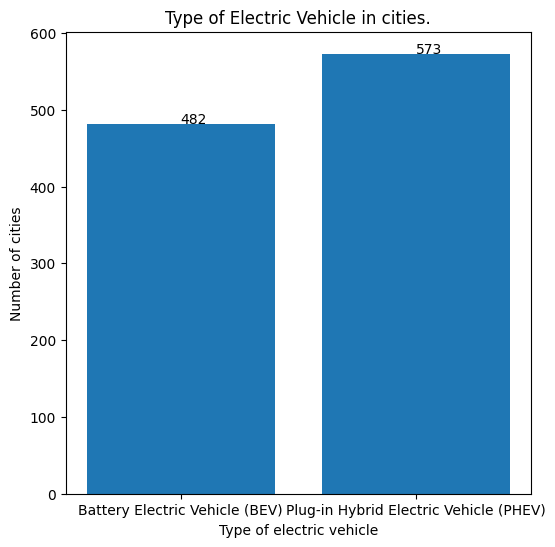

In [99]:
x = ['Battery Electric Vehicle (BEV)','Plug-in Hybrid Electric Vehicle (PHEV)']

y = [len(phev['City'].unique()), len(bev['City'].unique())]

plt.figure(figsize=(6,6))

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i])
addlabels(x,y)
plt.title("Type of Electric Vehicle in cities.")
plt.xlabel("Type of electric vehicle")
plt.ylabel("Number of cities")

plt.bar(x,y);

In [135]:
cities = data['City'].unique()

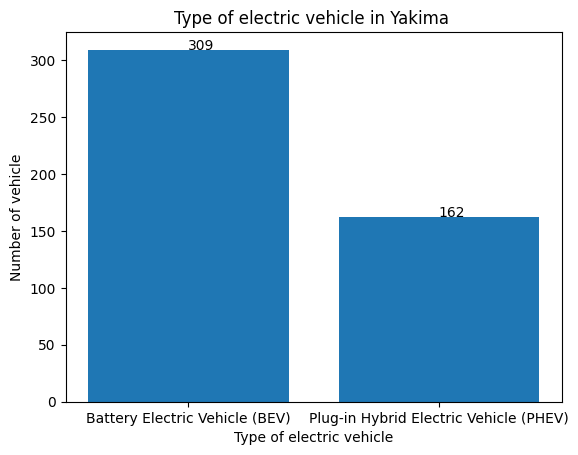

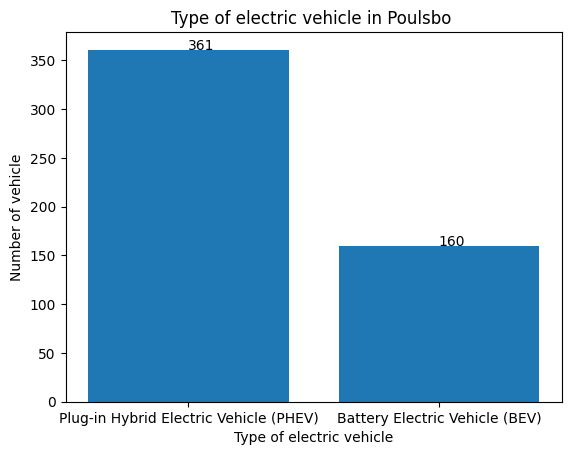

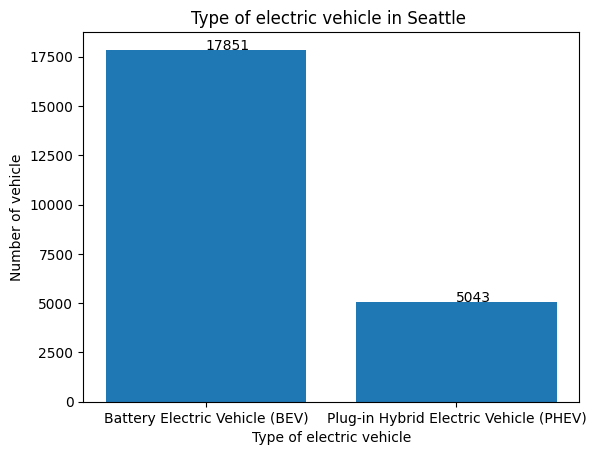

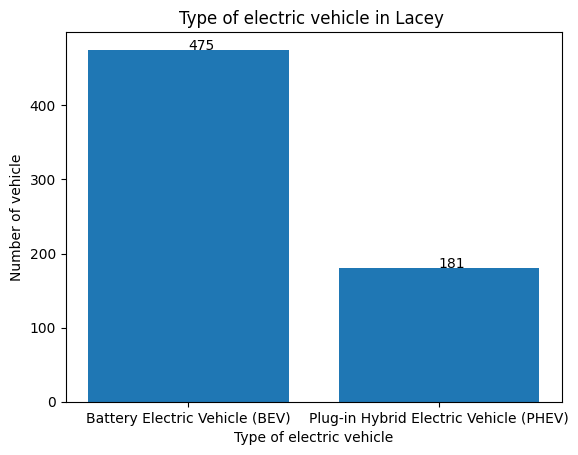

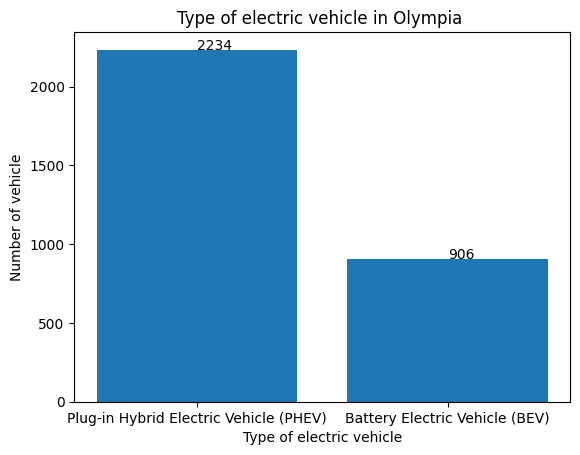

...

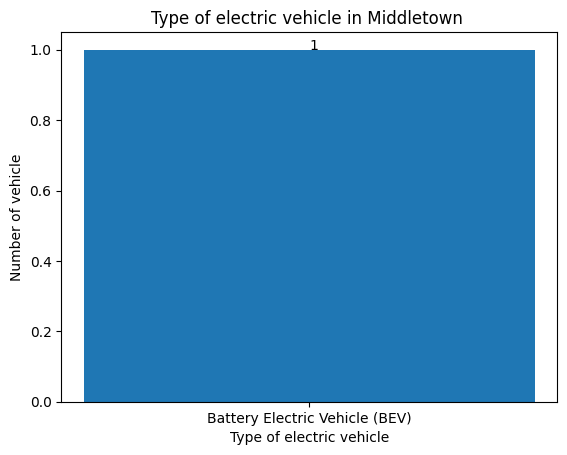

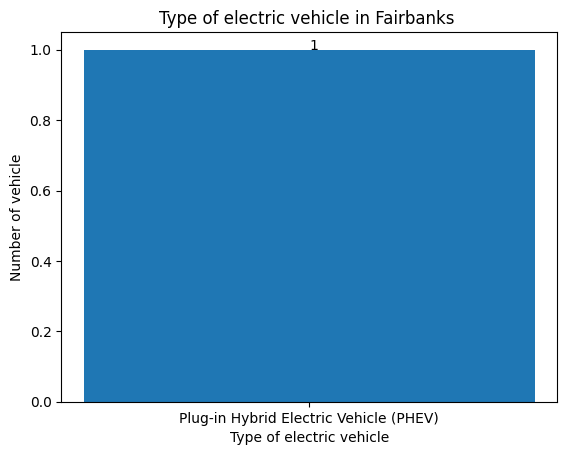

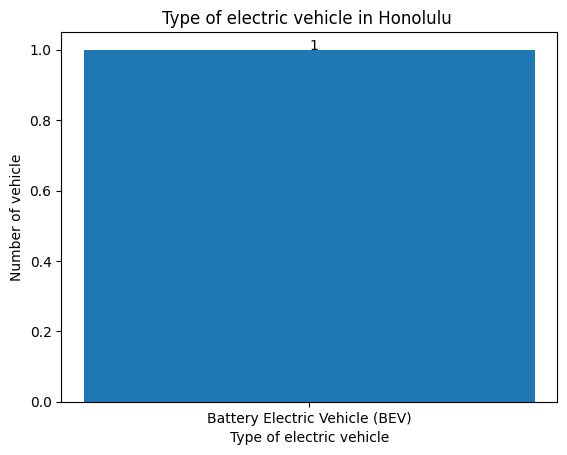

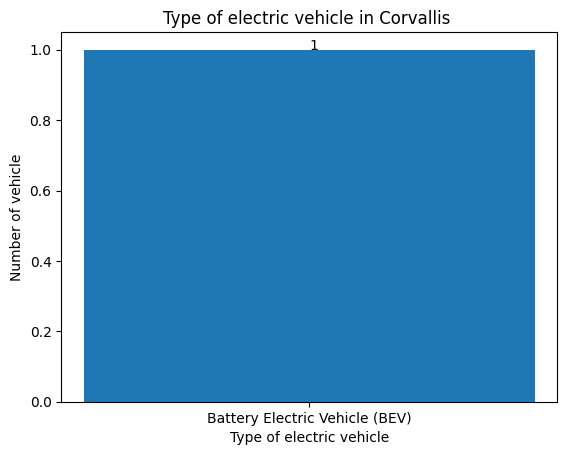

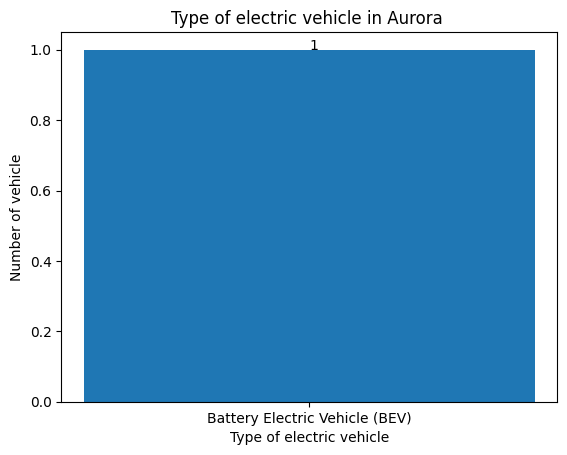

In [138]:
for i in cities:
    city =  data[data['City'] == i]  
    x = city['Electric Vehicle Type'].unique()
    y = city['Electric Vehicle Type'].value_counts()
    def addlabels(x,y):
        for i in range(len(x)):
            plt.text(i,y[i],y[i])
    addlabels(x,y)
    plt.title(f"Type of electric vehicle in {i} ")
    plt.xlabel("Type of electric vehicle")
    plt.ylabel("Number of vehicle")
    plt.bar(x,y)
    plt.show()